In [1]:
# Which NBA players offers the best value for their salary?

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
df=pd.read_csv('cleaned_pergame_and_advance_2023_w_salaries.csv')

In [3]:
df.head()

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,STL,BLK,TOV,PF,PTS,Awards,Player-additional,Season Type,PER,Adjusted Salary
0,1,Joel Embiid,28,PHI,C,66.0,66.0,34.6,11.0,20.1,...,1.0,1.7,3.4,3.1,33.1,MVP-1DPOY-9CPOY-5ASNBA1,embiijo01,Regular,31.4,35605377.25
1,2,Luka Dončić,23,DAL,PG,66.0,66.0,36.2,10.9,22.0,...,1.4,0.5,3.6,2.5,32.4,MVP-8CPOY-8ASNBA1,doncilu01,Regular,28.7,39290951.43
2,3,Damian Lillard,32,POR,PG,58.0,58.0,36.3,9.6,20.7,...,0.9,0.3,3.3,1.9,32.2,CPOY-10ASNBA3,lillada01,Regular,26.7,45006144.50
3,4,Shai Gilgeous-Alexander,24,OKC,PG,68.0,68.0,35.5,10.4,20.3,...,1.6,1.0,2.8,2.8,31.4,MVP-5CPOY-7ASNBA1,gilgesh01,Regular,27.2,32742459.52
4,5,Giannis Antetokounmpo,28,MIL,PF,63.0,63.0,32.1,11.2,20.3,...,0.8,0.8,3.9,3.1,31.1,MVP-3DPOY-6ASNBA1,antetgi01,Regular,29.0,45006144.50


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 896 entries, 0 to 895
Data columns (total 35 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Rk                 896 non-null    int64  
 1   Player             896 non-null    object 
 2   Age                896 non-null    int64  
 3   Team               896 non-null    object 
 4   Pos                896 non-null    object 
 5   G                  896 non-null    float64
 6   GS                 896 non-null    float64
 7   MP                 896 non-null    float64
 8   FG                 896 non-null    float64
 9   FGA                896 non-null    float64
 10  FG%                896 non-null    float64
 11  3P                 896 non-null    float64
 12  3PA                896 non-null    float64
 13  3P%                896 non-null    float64
 14  2P                 896 non-null    float64
 15  2PA                896 non-null    float64
 16  2P%                896 non

In [5]:
pd.set_option('display.max_columns',None)
df.head()

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Player-additional,Season Type,PER,Adjusted Salary
0,1,Joel Embiid,28,PHI,C,66.0,66.0,34.6,11.0,20.1,0.548,1.0,3.0,0.330,10.0,17.1,0.587,0.573,10.0,11.7,0.857,1.7,8.4,10.2,4.2,1.0,1.7,3.4,3.1,33.1,MVP-1DPOY-9CPOY-5ASNBA1,embiijo01,Regular,31.4,35605377.25
1,2,Luka Dončić,23,DAL,PG,66.0,66.0,36.2,10.9,22.0,0.496,2.8,8.2,0.342,8.1,13.8,0.588,0.560,7.8,10.5,0.742,0.8,7.8,8.6,8.0,1.4,0.5,3.6,2.5,32.4,MVP-8CPOY-8ASNBA1,doncilu01,Regular,28.7,39290951.43
2,3,Damian Lillard,32,POR,PG,58.0,58.0,36.3,9.6,20.7,0.463,4.2,11.3,0.371,5.4,9.4,0.574,0.564,8.8,9.6,0.914,0.8,4.0,4.8,7.3,0.9,0.3,3.3,1.9,32.2,CPOY-10ASNBA3,lillada01,Regular,26.7,45006144.50
3,4,Shai Gilgeous-Alexander,24,OKC,PG,68.0,68.0,35.5,10.4,20.3,0.510,0.9,2.5,0.345,9.5,17.8,0.533,0.531,9.8,10.9,0.905,0.9,4.0,4.8,5.5,1.6,1.0,2.8,2.8,31.4,MVP-5CPOY-7ASNBA1,gilgesh01,Regular,27.2,32742459.52
4,5,Giannis Antetokounmpo,28,MIL,PF,63.0,63.0,32.1,11.2,20.3,0.553,0.7,2.7,0.275,10.5,17.6,0.596,0.572,7.9,12.3,0.645,2.2,9.6,11.8,5.7,0.8,0.8,3.9,3.1,31.1,MVP-3DPOY-6ASNBA1,antetgi01,Regular,29.0,45006144.50


In [6]:
df.drop('Player-additional',axis=1,inplace=True)
df.drop('Awards',axis=1,inplace=True)
df.drop('ORB',axis=1,inplace=True)
df.drop('DRB',axis=1,inplace=True)
df.drop('GS',axis=1,inplace=True)

In [7]:
df['Pos'].unique()

array(['C', 'PG', 'PF', 'SF', 'SG'], dtype=object)

In [8]:
df['Player'].unique()

array(['Joel Embiid', 'Luka Dončić', 'Damian Lillard',
       'Shai Gilgeous-Alexander', 'Giannis Antetokounmpo', 'Jayson Tatum',
       'Stephen Curry', 'Kevin Durant', 'LeBron James',
       'Donovan Mitchell', 'Devin Booker', 'Kyrie Irving', 'Jaylen Brown',
       'Ja Morant', 'Trae Young', 'Zion Williamson', 'Anthony Davis',
       'Lauri Markkanen', 'Julius Randle', "De'Aaron Fox", 'Zach LaVine',
       'Brandon Ingram', 'Anthony Edwards', 'DeMar DeRozan',
       'Nikola Jokić', 'Pascal Siakam', 'Jalen Brunson', 'Paul George',
       'Kawhi Leonard', 'LaMelo Ball', 'Bradley Beal',
       'Kristaps Porziņģis', 'Jimmy Butler', 'Jalen Green',
       'Keldon Johnson', 'Klay Thompson', 'Bojan Bogdanović',
       'Darius Garland', 'Desmond Bane', 'Kyle Kuzma', 'Terry Rozier',
       'Anfernee Simons', 'James Harden', 'CJ McCollum',
       'Jordan Clarkson', 'Karl-Anthony Towns', 'Tyrese Haliburton',
       'Jerami Grant', 'Dejounte Murray', 'Bam Adebayo', 'Jordan Poole',
       'Tyrese 

In [9]:
df['Team'].unique()

array(['PHI', 'DAL', 'POR', 'OKC', 'MIL', 'BOS', 'GSW', '2TM', 'BRK',
       'PHO', 'LAL', 'CLE', 'MEM', 'ATL', 'NOP', 'UTA', 'NYK', 'SAC',
       'CHI', 'MIN', 'DEN', 'TOR', 'LAC', 'CHO', 'WAS', 'MIA', 'HOU',
       'SAS', 'DET', 'IND', 'ORL'], dtype=object)

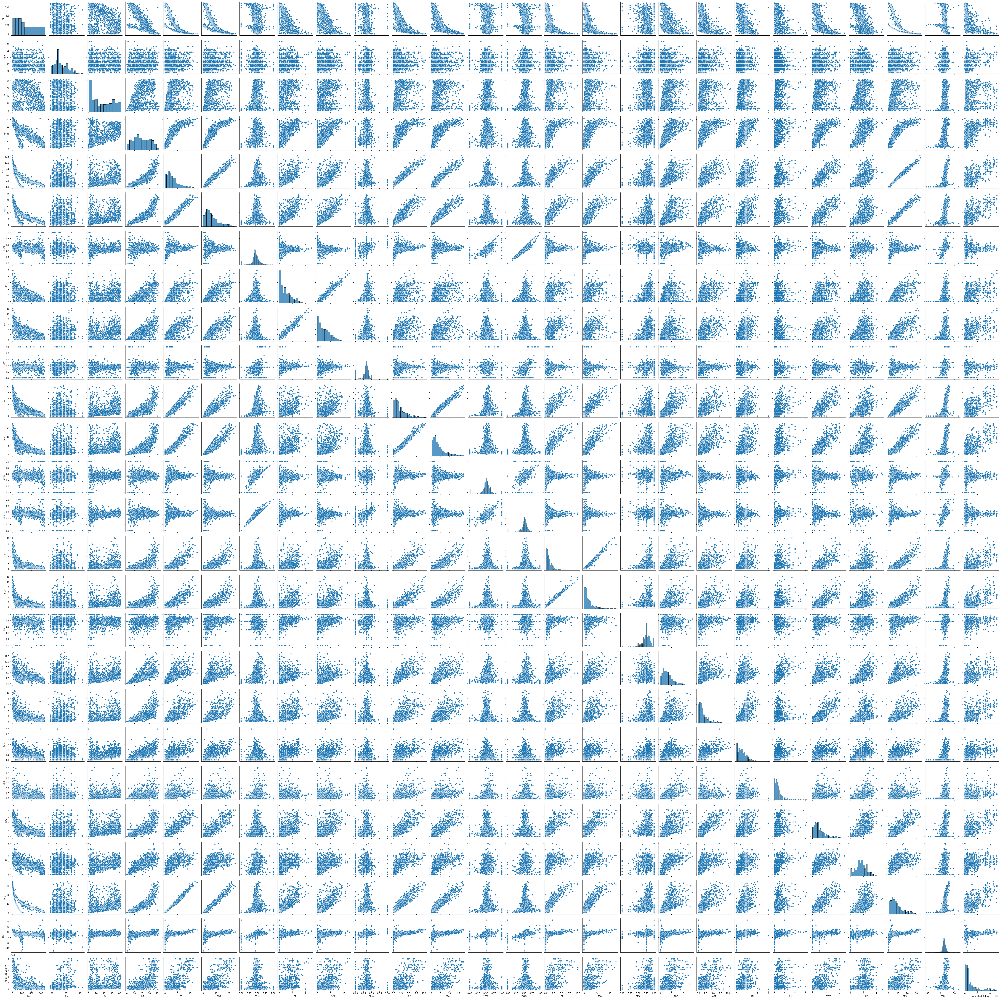

In [11]:
sns.pairplot(data=df)

In [10]:
grouped=df.groupby(['Rk','AST','TRB','eFG%','PTS','G','MP','Age','Player','Season Type']).agg({
    'PER':'mean',
    'Adjusted Salary':'mean'
}).reset_index()

In [11]:
grouped['PER per Million'] = grouped['PER']/(grouped['Adjusted Salary']/1e6)

In [12]:
grouped.head()

,Rk,AST,TRB,eFG%,PTS,G,MP,Age,Player,Season Type,PER,Adjusted Salary,PER per Million
0,1,4.2,10.2,0.573,33.1,66.0,34.6,28,Joel Embiid,Regular,31.4,35605377.25,0.881889
1,1,6.0,6.5,0.614,34.5,2.0,40.0,31,Kawhi Leonard,Playoff,29.9,45006144.50,0.664354
2,2,7.2,4.8,0.649,33.7,11.0,41.7,26,Devin Booker,Playoff,28.6,35834822.05,0.798106
3,2,8.0,8.6,0.560,32.4,66.0,36.2,23,Luka Dončić,Regular,28.7,39290951.43,0.730448
4,3,5.2,5.0,0.548,31.6,5.0,39.8,21,Anthony Edwards,Playoff,27.5,11368336.58,2.418999


In [13]:
regSeason = grouped[grouped['Season Type']=='Regular']
regSeason

,Rk,AST,TRB,eFG%,PTS,G,MP,Age,Player,Season Type,PER,Adjusted Salary,PER per Million
0,1,4.2,10.2,0.573,33.1,66.0,34.6,28,Joel Embiid,Regular,31.4,35605377.25,0.881889
3,2,8.0,8.6,0.560,32.4,66.0,36.2,23,Luka Dončić,Regular,28.7,39290951.43,0.730448
5,3,7.3,4.8,0.564,32.2,58.0,36.3,32,Damian Lillard,Regular,26.7,45006144.50,0.593252
6,4,5.5,4.8,0.531,31.4,68.0,35.5,24,Shai Gilgeous-Alexander,Regular,27.2,32742459.52,0.830726
8,5,5.7,11.8,0.572,31.1,63.0,32.1,28,Giannis Antetokounmpo,Regular,29.0,45006144.50,0.644356
...,...,...,...,...,...,...,...,...,...,...,...,...,...
891,675,0.5,2.0,0.000,0.0,4.0,6.0,27,Sterling Brown,Regular,7.0,3307320.19,2.116517
892,676,0.0,0.0,0.000,0.0,2.0,3.0,29,Deonte Burton,Regular,-12.6,111764.18,-112.737373
893,677,0.0,0.0,0.534,0.0,1.0,1.0,20,Michael Foster Jr.,Regular,0.0,4699471.69,0.000000
894,678,1.0,2.0,0.000,0.0,1.0,5.0,24,Frank Jackson,Regular,-6.8,119805.28,-56.758767


In [14]:
sortedByPERM = regSeason.sort_values('PER per Million',ascending=False).head(20)
sortedByPERM

,Rk,AST,TRB,eFG%,PTS,G,MP,Age,Player,Season Type,PER,Adjusted Salary,PER per Million
189,95,7.0,9.0,0.583,16.0,1.0,35.0,23,RaiQuan Gray,Regular,15.5,6195.00,2502.017756
798,582,7.0,4.0,0.500,3.0,1.0,41.0,24,Jacob Gilyard,Regular,7.3,6195.00,1178.369653
847,631,0.0,0.0,0.000,2.0,1.0,2.0,23,Stanley Umude,Regular,65.6,61953.17,1058.864300
516,300,1.7,2.0,0.524,8.0,3.0,18.7,29,Gabe York,Regular,11.8,34074.08,346.304288
383,192,2.0,3.0,0.654,10.6,5.0,25.4,23,Jeenathan Williams,Regular,15.5,55758.17,277.986168
592,376,0.5,3.0,0.857,6.5,2.0,15.0,22,Jay Scrubb,Regular,14.2,52660.14,269.653670
883,667,1.0,0.8,0.250,1.0,5.0,5.6,25,Kobi Simmons,Regular,9.0,34735.00,259.104649
864,648,0.5,0.0,0.750,1.5,2.0,3.0,24,Jordan Schakel,Regular,24.3,102223.31,237.714862
796,580,0.0,0.7,0.900,3.0,3.0,2.7,26,Tyler Dorsey,Regular,45.5,213739.64,212.875815
539,323,1.4,3.0,0.720,7.3,7.0,13.6,24,Jay Huff,Regular,22.3,123906.33,179.974663


In [15]:
df[df['Player']=='RaiQuan Gray']

,Rk,Player,Age,Team,Pos,G,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,TRB,AST,STL,BLK,TOV,PF,PTS,Season Type,PER,Adjusted Salary
94,95,RaiQuan Gray,23,BRK,PF,1.0,35.0,6.0,12.0,0.5,2.0,5.0,0.4,4.0,7.0,0.571,0.583,2.0,2.0,1.0,9.0,7.0,0.0,1.0,4.0,5.0,16.0,Regular,15.5,6195.0


In [16]:
filteredSal = regSeason[regSeason['Adjusted Salary']>1e6]
filteredSal.head(20)

,Rk,AST,TRB,eFG%,PTS,G,MP,Age,Player,Season Type,PER,Adjusted Salary,PER per Million
0,1,4.2,10.2,0.573,33.1,66.0,34.6,28,Joel Embiid,Regular,31.4,35605377.25,0.881889
3,2,8.0,8.6,0.560,32.4,66.0,36.2,23,Luka Dončić,Regular,28.7,39290951.43,0.730448
5,3,7.3,4.8,0.564,32.2,58.0,36.3,32,Damian Lillard,Regular,26.7,45006144.50,0.593252
6,4,5.5,4.8,0.531,31.4,68.0,35.5,24,Shai Gilgeous-Alexander,Regular,27.2,32742459.52,0.830726
8,5,5.7,11.8,0.572,31.1,63.0,32.1,28,Giannis Antetokounmpo,Regular,29.0,45006144.50,0.644356
10,6,4.6,8.8,0.543,30.1,74.0,36.9,24,Jayson Tatum,Regular,23.7,32147246.07,0.737233
13,7,6.3,6.1,0.614,29.4,56.0,34.7,34,Stephen Curry,Regular,24.1,50913606.01,0.473351
14,8,5.0,6.7,0.614,29.1,47.0,35.6,34,Kevin Durant,Regular,25.9,46729763.91,0.554251
16,9,5.3,6.7,0.607,29.7,39.0,36.0,34,Kevin Durant,Regular,26.2,46729763.91,0.560670
18,10,3.5,6.4,0.656,26.0,8.0,33.6,34,Kevin Durant,Regular,24.3,46729763.91,0.520011


In [17]:
top20Players = filteredSal.sort_values('PER per Million',ascending=False)
top20Players.head(20)

,Rk,AST,TRB,eFG%,PTS,G,MP,Age,Player,Season Type,PER,Adjusted Salary,PER per Million
267,134,5.6,4.5,0.576,13.2,22.0,25.8,28,Kris Dunn,Regular,19.1,1059156.27,18.033222
789,573,0.3,1.7,0.528,3.1,15.0,6.4,20,Josh Minott,Regular,17.9,1077988.05,16.605008
804,588,0.0,1.6,0.950,4.0,5.0,7.2,23,Terry Taylor,Regular,25.0,1804696.69,13.852743
482,266,1.4,1.9,0.533,8.8,48.0,14.8,20,Jaden Hardy,Regular,14.6,1077988.05,13.543749
619,403,2.4,6.8,0.520,10.8,19.0,23.3,23,Sandro Mamukelashvili,Regular,15.9,1182135.85,13.450231
681,465,1.0,1.8,0.523,5.0,5.0,11.8,26,Sam Merrill,Regular,15.5,1170919.39,13.237461
617,401,1.4,4.3,0.487,6.1,43.0,15.3,23,Sandro Mamukelashvili,Regular,13.4,1182135.85,11.335415
587,371,2.7,3.3,0.501,6.6,62.0,17.8,24,Jordan Goodwin,Regular,14.8,1355936.86,10.914963
551,335,1.0,3.5,0.489,9.7,17.0,21.9,25,Eugene Omoruyi,Regular,11.2,1073050.27,10.437535
436,220,0.7,6.8,0.691,12.1,41.0,21.4,25,Thomas Bryant,Regular,21.5,2084602.82,10.313715


In [18]:
df[df['Player']=='Kris Dunn']

,Rk,Player,Age,Team,Pos,G,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,TRB,AST,STL,BLK,TOV,PF,PTS,Season Type,PER,Adjusted Salary
133,134,Kris Dunn,28,UTA,PG,22.0,25.8,5.3,9.8,0.537,0.8,1.6,0.472,4.5,8.2,0.55,0.576,1.9,2.4,0.774,4.5,5.6,1.1,0.5,1.6,2.6,13.2,Regular,19.1,1059156.27


In [19]:
filteredMP = top20Players[top20Players['MP']>24]
filteredMP.head(20)

,Rk,AST,TRB,eFG%,PTS,G,MP,Age,Player,Season Type,PER,Adjusted Salary,PER per Million
267,134,5.6,4.5,0.576,13.2,22.0,25.8,28,Kris Dunn,Regular,19.1,1059156.27,18.033222
273,137,3.4,3.0,0.616,13.0,64.0,28.8,24,Austin Reaves,Regular,14.9,1656008.24,8.997540
275,138,6.6,3.6,0.489,12.9,68.0,29.2,23,Tre Jones,Regular,16.0,1888072.33,8.474252
84,43,4.4,5.0,0.568,21.5,58.0,31.7,24,Desmond Bane,Regular,19.1,2256254.81,8.465356
287,144,1.5,5.5,0.617,12.7,82.0,28.0,22,KJ Martin,Regular,15.4,1888072.33,8.156467
223,112,3.4,4.2,0.537,14.9,81.0,28.9,23,Immanuel Quickley,Regular,16.3,2453257.67,6.644227
494,278,2.6,2.8,0.545,8.6,80.0,26.2,23,Ayo Dosunmu,Regular,10.2,1656008.24,6.159390
110,56,3.5,2.9,0.568,20.3,60.0,33.6,22,Tyrese Maxey,Regular,17.0,2888189.17,5.886041
455,239,2.0,4.8,0.513,10.6,56.0,26.7,25,Jalen McDaniels,Regular,11.6,2044890.85,5.672674
343,172,2.1,3.2,0.535,11.5,80.0,28.4,26,Max Strus,Regular,10.8,1923083.76,5.615980


In [20]:
filteredGamesPlayed = filteredMP[filteredMP['G']>41].head(10)
filteredGamesPlayed

,Rk,AST,TRB,eFG%,PTS,G,MP,Age,Player,Season Type,PER,Adjusted Salary,PER per Million
273,137,3.4,3.0,0.616,13.0,64.0,28.8,24,Austin Reaves,Regular,14.9,1656008.24,8.997540
275,138,6.6,3.6,0.489,12.9,68.0,29.2,23,Tre Jones,Regular,16.0,1888072.33,8.474252
84,43,4.4,5.0,0.568,21.5,58.0,31.7,24,Desmond Bane,Regular,19.1,2256254.81,8.465356
287,144,1.5,5.5,0.617,12.7,82.0,28.0,22,KJ Martin,Regular,15.4,1888072.33,8.156467
223,112,3.4,4.2,0.537,14.9,81.0,28.9,23,Immanuel Quickley,Regular,16.3,2453257.67,6.644227
494,278,2.6,2.8,0.545,8.6,80.0,26.2,23,Ayo Dosunmu,Regular,10.2,1656008.24,6.159390
110,56,3.5,2.9,0.568,20.3,60.0,33.6,22,Tyrese Maxey,Regular,17.0,2888189.17,5.886041
455,239,2.0,4.8,0.513,10.6,56.0,26.7,25,Jalen McDaniels,Regular,11.6,2044890.85,5.672674
343,172,2.1,3.2,0.535,11.5,80.0,28.4,26,Max Strus,Regular,10.8,1923083.76,5.615980
225,113,3.9,9.0,0.565,14.8,75.0,28.9,20,Alperen Şengün,Regular,19.7,3575030.15,5.510443


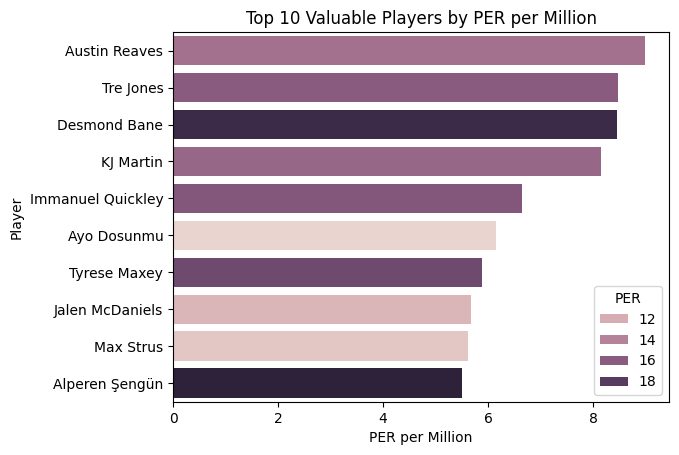

In [21]:
sns.barplot(data=filteredGamesPlayed,x='PER per Million',y='Player',hue='PER')
plt.title("Top 10 Valuable Players by PER per Million")
plt.savefig("players_by_PER_per_mil.png")

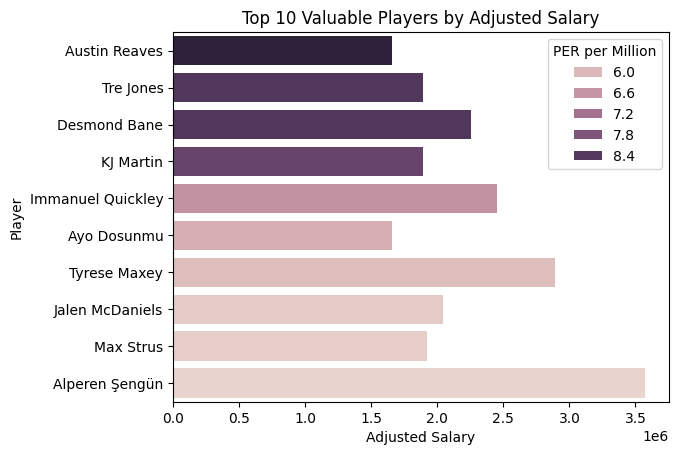

In [22]:
sns.barplot(data=filteredGamesPlayed,x='Adjusted Salary',y='Player',hue='PER per Million')
plt.title("Top 10 Valuable Players by Adjusted Salary")
plt.savefig("top10players_by_adjusted_salary.png")

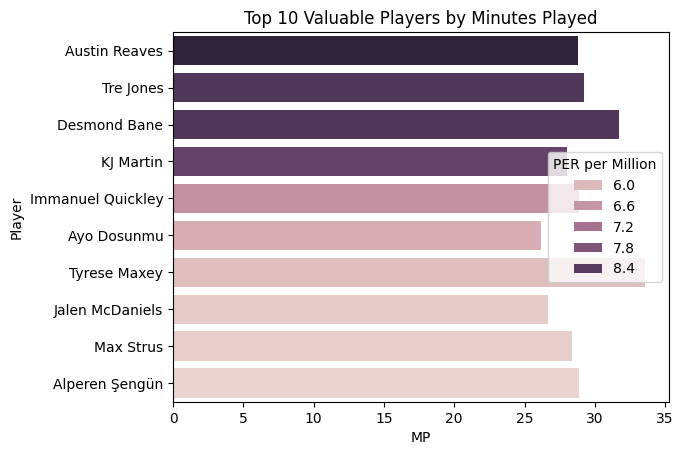

In [23]:
sns.barplot(data=filteredGamesPlayed,x='MP',y='Player',hue='PER per Million')
plt.title("Top 10 Valuable Players by Minutes Played")
plt.savefig("top10players_by_minutes_played.png")

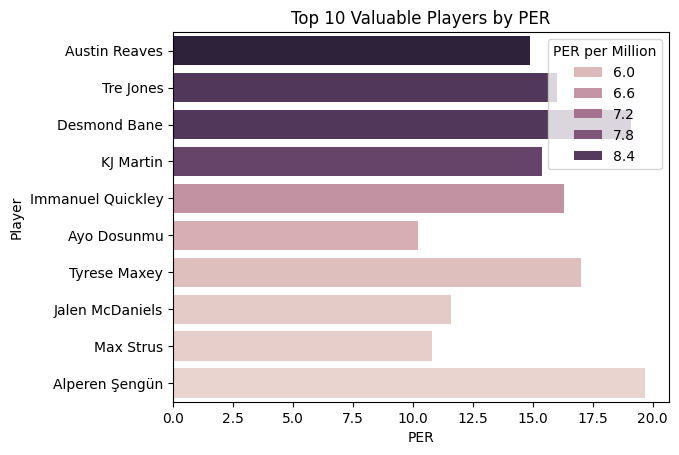

In [24]:
sns.barplot(data=filteredGamesPlayed,x='PER',y='Player',hue='PER per Million')
plt.title("Top 10 Valuable Players by PER")
plt.savefig("top10players_by_PER.png")

Removing Ayo Dosunmu, Jalen McDaniels, and Max Strus due to lowest PER

In [25]:
top7Players = filteredGamesPlayed[filteredGamesPlayed['PER']>12].head(7)
top7Players

,Rk,AST,TRB,eFG%,PTS,G,MP,Age,Player,Season Type,PER,Adjusted Salary,PER per Million
273,137,3.4,3.0,0.616,13.0,64.0,28.8,24,Austin Reaves,Regular,14.9,1656008.24,8.997540
275,138,6.6,3.6,0.489,12.9,68.0,29.2,23,Tre Jones,Regular,16.0,1888072.33,8.474252
84,43,4.4,5.0,0.568,21.5,58.0,31.7,24,Desmond Bane,Regular,19.1,2256254.81,8.465356
287,144,1.5,5.5,0.617,12.7,82.0,28.0,22,KJ Martin,Regular,15.4,1888072.33,8.156467
223,112,3.4,4.2,0.537,14.9,81.0,28.9,23,Immanuel Quickley,Regular,16.3,2453257.67,6.644227
110,56,3.5,2.9,0.568,20.3,60.0,33.6,22,Tyrese Maxey,Regular,17.0,2888189.17,5.886041
225,113,3.9,9.0,0.565,14.8,75.0,28.9,20,Alperen Şengün,Regular,19.7,3575030.15,5.510443


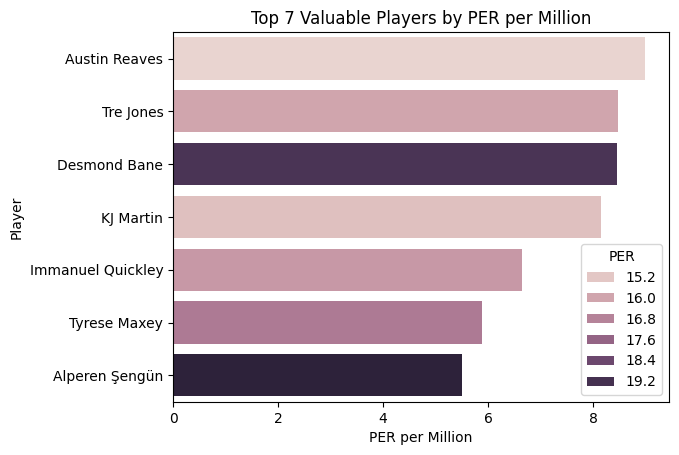

In [28]:
sns.barplot(data=top7Players,x='PER per Million',y='Player',hue='PER')
plt.title("Top 7 Valuable Players by PER per Million")
plt.savefig("top7players_by_PER_per_mil.png")

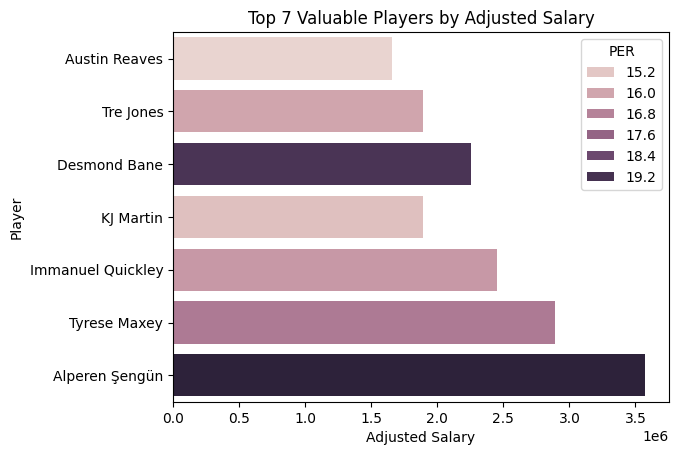

In [29]:
sns.barplot(data=top7Players,x='Adjusted Salary',y='Player',hue='PER')
plt.title("Top 7 Valuable Players by Adjusted Salary")
plt.savefig("top7players_by_adjusted_salary.png")

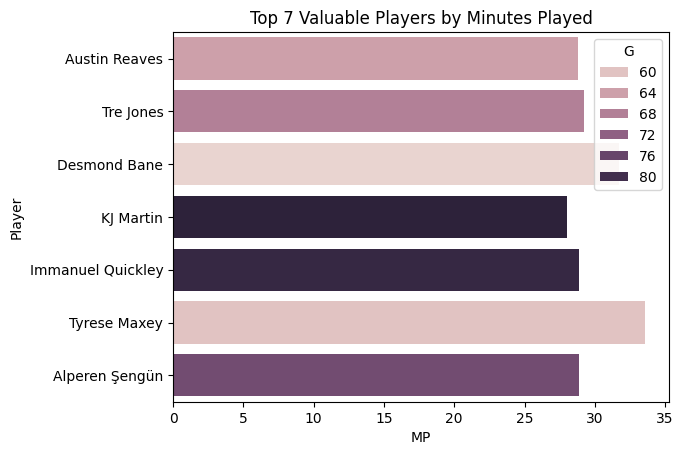

In [30]:
sns.barplot(data=top7Players,x='MP',y='Player',hue='G')
plt.title("Top 7 Valuable Players by Minutes Played")
plt.savefig("top7players_by_minutes_played.png")

Based on PER per Million, games played, minutes played, PER, and salary, the top valued players in the NBA for their teams are: Austin Reaves and Desmond Bane. They offer the strongest combination of performance and cost-efficiency.

Low Cost and Great Value: Austin Reaves

Costly but Outstanding Performance: Desmond Bane

In [31]:
top7Players.to_csv("nba_valuablePlayers_cleaned.csv",index=False)